In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
!pip install keras-cv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 59.2 MB/s eta 0:00:00


In [ ]:
# Importing dependencies

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.notebook import tqdm

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras import *
from tensorflow.keras import models
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.callbacks import *
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomBrightness
from tensorflow.keras.callbacks import LearningRateScheduler
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import keras_cv
from keras_cv.losses import FocalLoss
from tabulate import tabulate
import seaborn as sns

import collections
from collections import Counter


BATCH_SIZE = 16
AUTO = tf.data.AUTOTUNE

In [ ]:
from tensorflow import keras
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import io
from PIL import Image, ImageDraw, ImageFont

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def parse_txt_annot(img_path, txt_path):
    img = cv2.imread(img_path)
    w = int(img.shape[0])
    h = int(img.shape[1])

    with open(txt_path, "r", encoding='utf-8-sig') as file_label:
        lines = file_label.read().split('\n')

    boxes = []
    classes = []
    class_id_to_index = {3: 0, 4: 1, 5: 2}

    for line in lines:
        if not line.strip():
            continue
        objbud = line.strip().split(' ')
        class_id = int(objbud[0])

        if class_id not in class_id_to_index:
            continue

        x1 = float(objbud[1])
        y1 = float(objbud[2])
        w1 = float(objbud[3])
        h1 = float(objbud[4])

        xmin = int((x1 * w) - (w1 * w) / 2.0)
        ymin = int((y1 * h) - (h1 * h) / 2.0)
        xmax = int((x1 * w) + (w1 * w) / 2.0)
        ymax = int((y1 * h) + (h1 * h) / 2.0)

        boxes.append([xmin, ymin, xmax, ymax])
        classes.append(class_id_to_index[class_id])

    return img_path, classes, boxes

def create_paths_list(path):
    full_path = []
    images = sorted(os.listdir(path))

    for i in images:
        full_path.append(os.path.join(path, i))

    return full_path

class_ids = ['Acne']
class_mapping = {0: 'nodul',
                 1: 'papule',
                 2: 'pustule',}

In [ ]:
def creating_files(img_files_paths, annot_files_paths):

    img_files = create_paths_list(img_files_paths)
    annot_files = create_paths_list(annot_files_paths)

    image_paths = []
    bbox = []
    classes = []

    for i in range(0,len(img_files)):
        image_path_, classes_, bbox_ = parse_txt_annot(img_files[i], annot_files[i])
        image_paths.append(image_path_)
        bbox.append(bbox_)
        classes.append(classes_)

    image_paths = tf.ragged.constant(image_paths)
    bbox = tf.ragged.constant(bbox)
    classes = tf.ragged.constant(classes)

    return image_paths, classes, bbox

In [ ]:
train_img_paths, train_classes, train_bboxes = creating_files('/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/train_coba_7/images',
                                                              '/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/train_coba_7/labels')

valid_img_paths, valid_classes, valid_bboxes = creating_files('/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/valid3/images',
                                                             '/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/valid3/labels')

test_img_paths, test_classes, test_bboxes = creating_files('/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/test3/images',
                                                          '/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/test3/labels')

In [ ]:
def img_preprocessing(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels = 3)
    img = tf.cast(img, tf.float32)

    return img


resizing = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(0.8, 1.25),
    bounding_box_format="xyxy")

def load_ds(img_paths, classes, bbox):
    img = img_preprocessing(img_paths)

    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox }

    return {"images": img, "bounding_boxes": bounding_boxes}

def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]

In [ ]:
train_loader = tf.data.Dataset.from_tensor_slices((train_img_paths, train_classes, train_bboxes))
train_dataset = (train_loader
                .map(load_ds, num_parallel_calls=AUTO)
                .shuffle(BATCH_SIZE*10)
                .ragged_batch(BATCH_SIZE, drop_remainder=False)
                .map(resizing, num_parallel_calls=AUTO)
                .map(dict_to_tuple, num_parallel_calls=AUTO)
                .prefetch(AUTO))


valid_loader = tf.data.Dataset.from_tensor_slices((valid_img_paths, valid_classes, valid_bboxes))
valid_dataset = (valid_loader
                .map(load_ds, num_parallel_calls = AUTO)
                .ragged_batch(BATCH_SIZE, drop_remainder = False)
                .map(resizing, num_parallel_calls = AUTO)
                .map(dict_to_tuple, num_parallel_calls = AUTO)
                .prefetch(AUTO))


test_loader = tf.data.Dataset.from_tensor_slices((test_img_paths, test_classes, test_bboxes))
test_dataset = (test_loader
               .map(load_ds, num_parallel_calls = AUTO)
               .ragged_batch(BATCH_SIZE, drop_remainder = False)
               .map(resizing, num_parallel_calls = AUTO)
               .map(dict_to_tuple, num_parallel_calls = AUTO)
               .prefetch(AUTO))

In [ ]:
class_mapping1 = {
    "3": "nodule",
    "4": "papule",
    "5": "pustule"
}

def plot_class_distribution_from_folder(folder_path, class_mapping):
    class_counter = Counter()

    for file_name in os.listdir(folder_path):
        if file_name.endswith(".txt"):
            file_path = os.path.join(folder_path, file_name)
            with open(file_path, "r") as file:
                for line in file:
                    label = line.split()[0]
                    if label in class_mapping:
                        class_counter[label] += 1

    labels = [class_mapping[label] for label in class_counter.keys()]
    counts = list(class_counter.values())

    plt.bar(labels, counts, color='skyblue')
    plt.xlabel("Classes")
    plt.ylabel("Frequency")
    plt.title("Class Distribution")

    for i, count in enumerate(counts):
        plt.text(i, count + 0.5, str(count), ha='center', fontsize=10)

    plt.show()

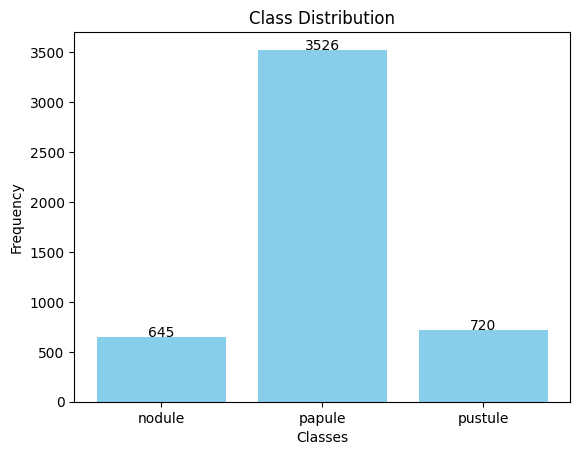

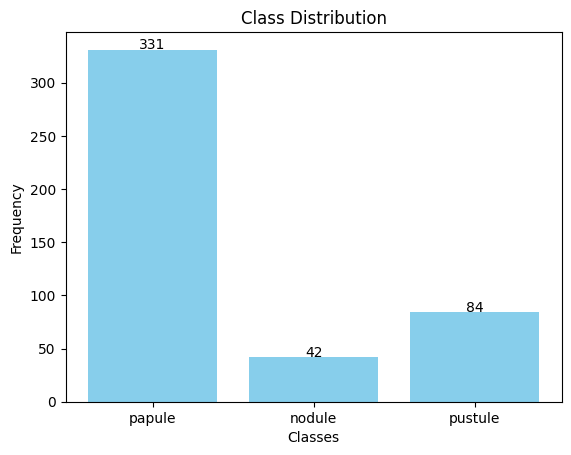

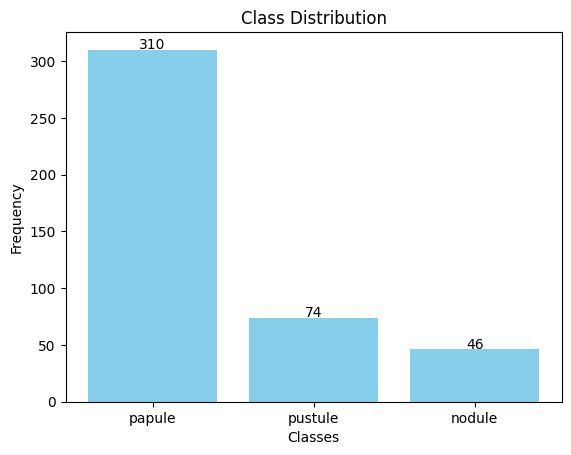

In [ ]:
plot_class_distribution_from_folder('/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/train_coba_7/labels', class_mapping1)
plot_class_distribution_from_folder('/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/valid3/labels', class_mapping1)
plot_class_distribution_from_folder('/content/drive/MyDrive/Proposal/prototype/Acne_Dataset_in_YOLOv8_Format/test3/labels', class_mapping1)

In [ ]:
def calculate_class_distribution(dataset, class_mapping):
    class_counts = collections.defaultdict(int)

    for images, y_true in dataset:
        classes = y_true['classes']

        for batch_classes in classes.numpy():
            for cls in batch_classes:
                if cls >= 0:
                    class_counts[cls] += 1

    class_distribution = {
        class_mapping.get(cls, f"Unknown({cls})"): count
        for cls, count in class_counts.items()
    }
    return class_distribution


def plot_class_distribution(distribution, title="Class Distribution", figsize=(10, 6)):
    classes = list(distribution.keys())
    counts = list(distribution.values())

    plt.figure(figsize=figsize)
    bars = plt.bar(classes, counts, alpha=0.75, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Counts')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    for bar, count in zip(bars, counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 5,
            str(count),
            ha='center', va='bottom', fontsize=10
        )

    plt.tight_layout()
    plt.show()

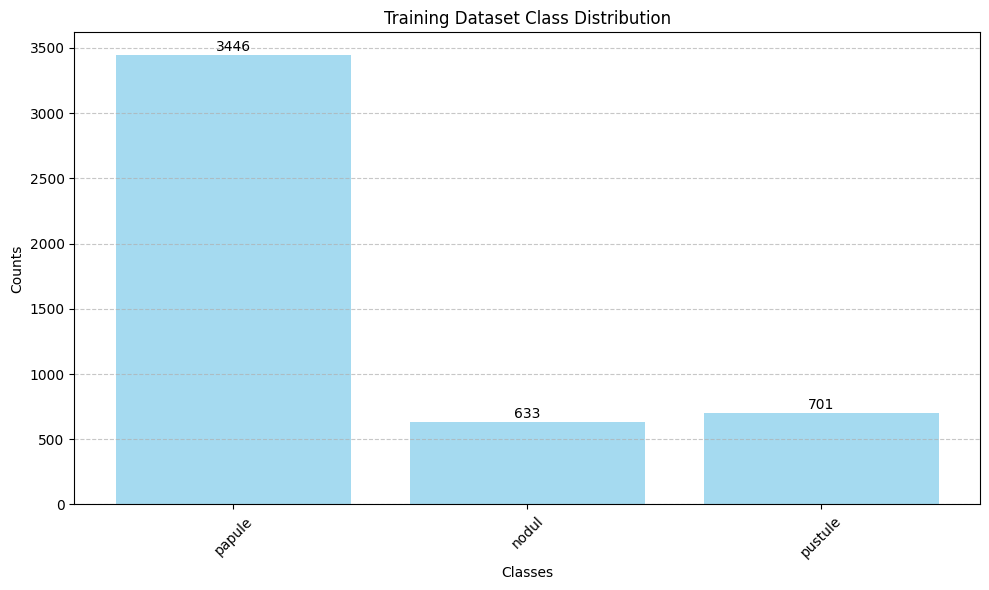

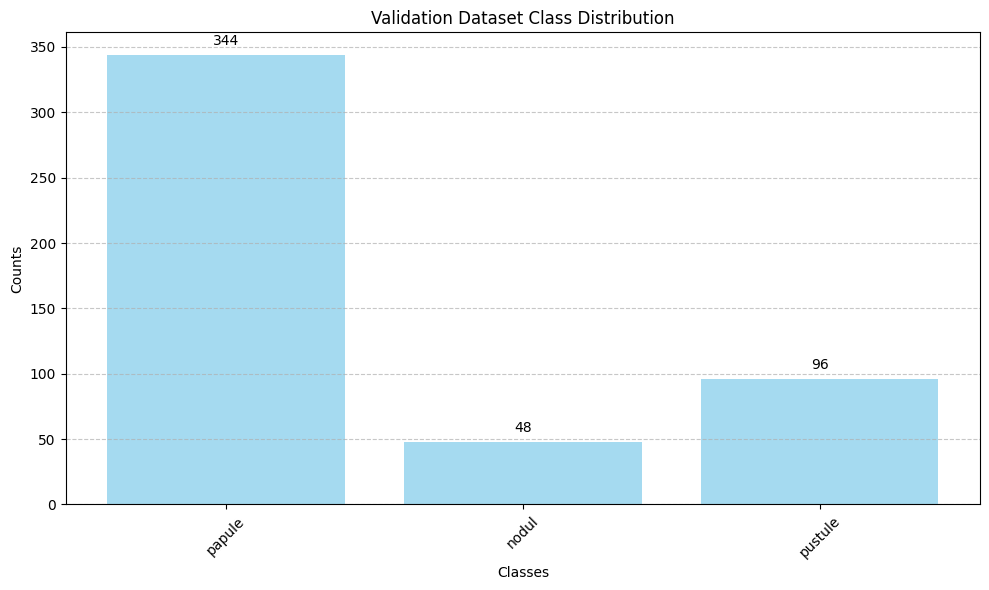

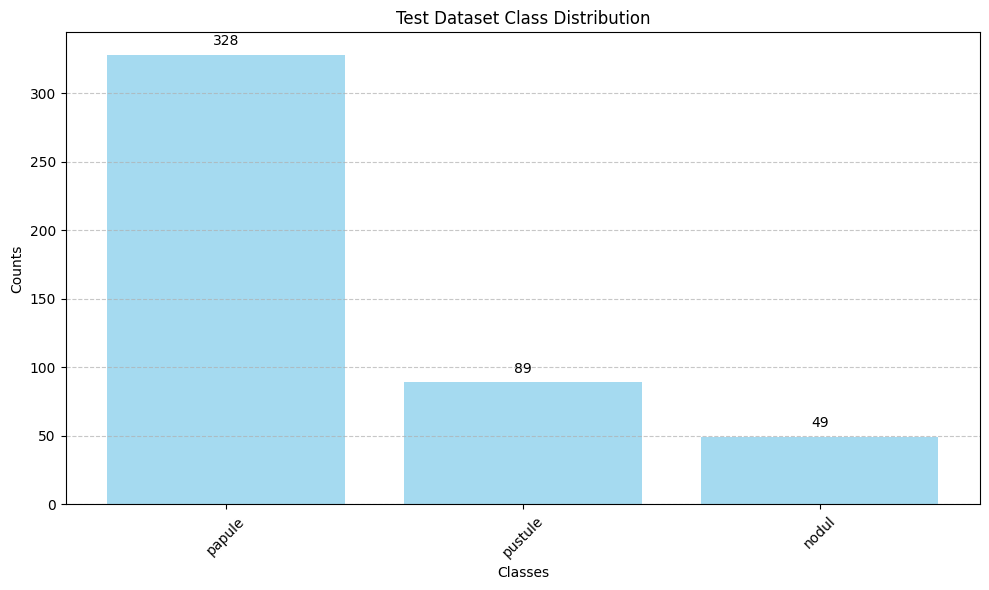

In [ ]:
train_distribution = calculate_class_distribution(train_dataset, class_mapping)
valid_distribution = calculate_class_distribution(valid_dataset, class_mapping)
test_distribution = calculate_class_distribution(test_dataset, class_mapping)

plot_class_distribution(train_distribution, title="Training Dataset Class Distribution")
plot_class_distribution(valid_distribution, title="Validation Dataset Class Distribution")
plot_class_distribution(test_distribution, title="Test Dataset Class Distribution")

In [ ]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs[0], inputs[1]

    keras_cv.visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale = 6,
        font_scale = 0.8,
        line_thickness=2,
        dpi = 100,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
        true_color = (192, 57, 43))

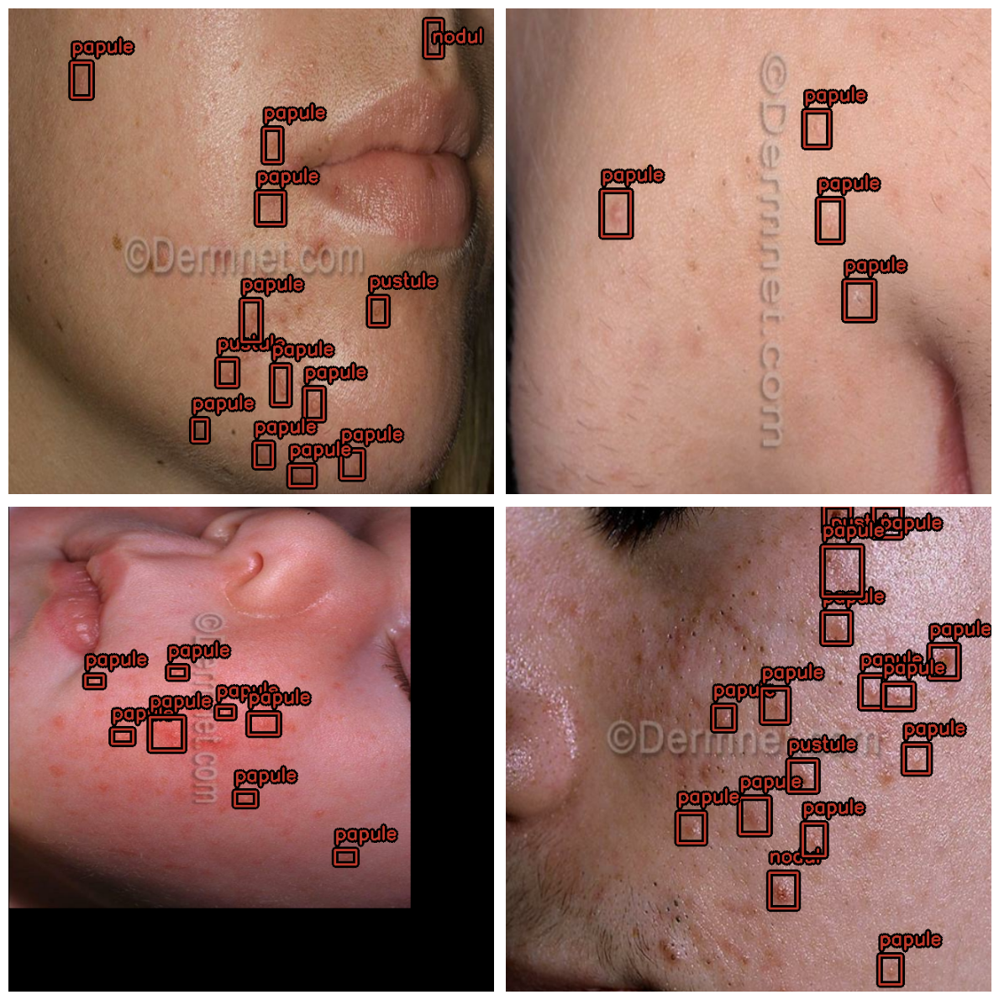

In [ ]:
visualize_dataset(train_dataset, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2)

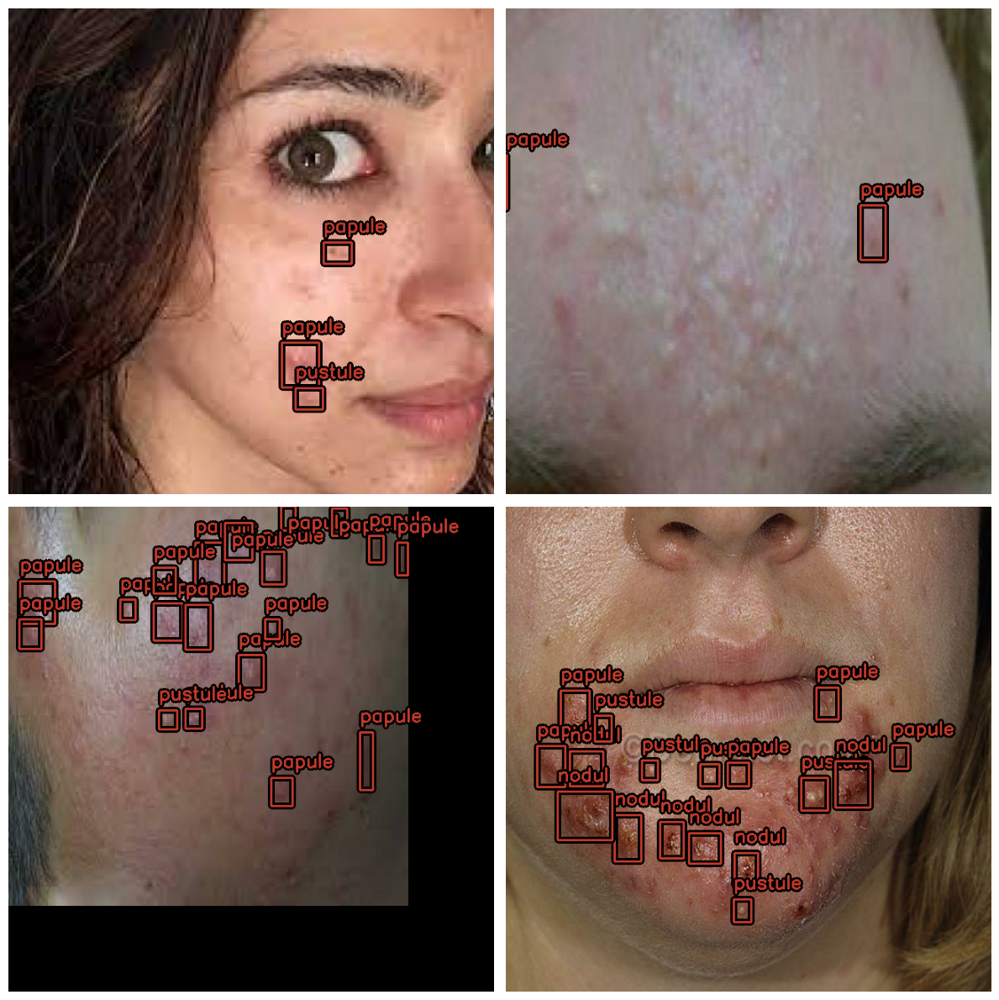

In [ ]:
visualize_dataset(test_dataset, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2)

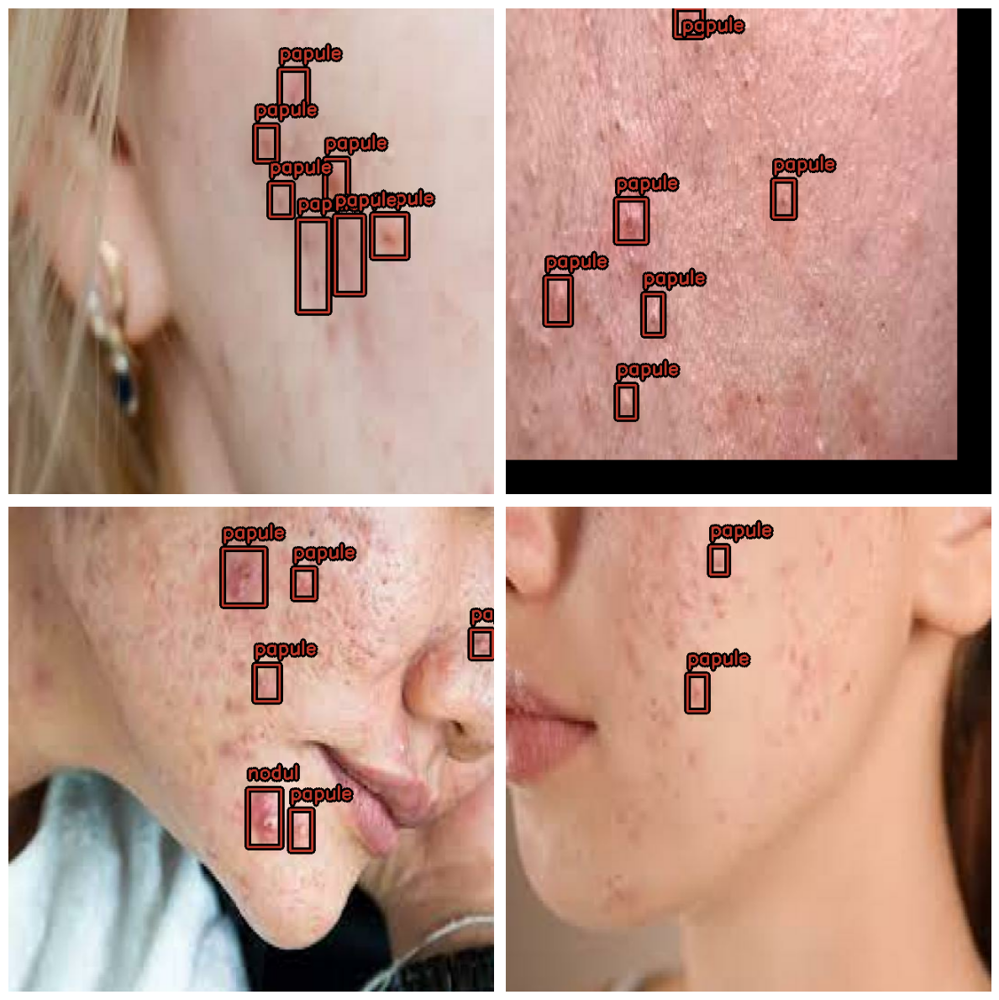

In [ ]:
visualize_dataset(valid_dataset, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2)

In [ ]:
os.makedirs('/content/checkpoints', exist_ok=True)

In [ ]:
stg = tf.distribute.MirroredStrategy()

In [ ]:
with stg.scope():
    backbone = keras_cv.models.YOLOV8Backbone.from_preset("yolo_v8_xs_backbone_coco", include_rescaling = True)

    YOLOV8_model = keras_cv.models.YOLOV8Detector(num_classes=len(class_mapping),
                                                  bounding_box_format = "xyxy", backbone = backbone, fpn_depth = 7)

    optimizer = AdamW(learning_rate=0.0005, weight_decay=0.0009, global_clipnorm = 10.0)
    my_callbacks = [ModelCheckpoint('/content/checkpoints/yolo_acne_detection.weights.h5', monitor = 'val_loss',save_best_only = True, save_weights_only = True),
                    ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=8, verbose=0, min_delta=0.001),
                    EarlyStopping(monitor='val_loss', patience=20)]


    YOLOV8_model.compile(optimizer = optimizer, classification_loss = 'binary_crossentropy', box_loss = 'ciou')

100%|██████████| 645/645 [00:00<00:00, 1.82MB/s]


100%|██████████| 5.11M/5.11M [00:01<00:00, 2.85MB/s]


In [ ]:
hist = YOLOV8_model.fit(train_dataset, validation_data = valid_dataset,  epochs = 100, callbacks = my_callbacks)

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - box_loss: 5.5742 - class_loss: 204.2240 - loss: 209.8775 - val_box_loss: 5.5192 - val_class_loss: 163.0381 - val_loss: 166.9267 - learning_rate: 5.0000e-04
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 19s 741ms/step - box_loss: 4.7081 - class_loss: 108.5687 - loss: 113.1998 - val_box_loss: 5.0595 - val_class_loss: 119.7174 - val_loss: 123.0424 - learning_rate: 5.0000e-04
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 19s 751ms/step - box_loss: 4.2046 - class_loss: 93.8405 - loss: 98.0632 - val_box_loss: 4.5768 - val_class_loss: 75.0751 - val_loss: 78.6436 - learning_rate: 5.0000e-04
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 19s 734ms/step - box_loss: 3.7816 - class_loss: 64.0717 - loss: 67.8445 - val_box_loss: 3.8000 - val_class_loss: 71.4703 - val_loss: 74.9810 - learning_rate: 5.0000e-04
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 19s 751ms/step - box_loss: 3.4165 - class_loss: 50.1164 - loss: 53.5453 - val_box_loss: 3.9063 - val_class_loss: 54.7645 - v

In [ ]:
YOLOV8_model.summary()

Model: "yolov8_detector"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional (Functional)   │ [(None, None, None,    │      1,277,680 │ input_layer_1[0][0]    │
│                           │ 64), (None, None,      │                │                        │
│                           │ None, 128), (None,     │                │                        │
│                           │ None, None, 256)]      │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ repeat (Repeat)           │ (None, None, None,     │              0 │ functional[0][2]       │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ repeat_1 (Repeat)         │ (None, None, None,     │              0 │ repeat[0][0]           │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, None, None,     │              0 │ repeat_1[0][0],        │
│ (Concatenate)             │ 384)                   │                │ functional[0][1]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pa_fpn_p4p5_pre_conv      │ (None, None, None,     │         49,152 │ concatenate_5[0][0]    │
│ (Conv2D)                  │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pa_fpn_p4p5_pre_bn        │ (None, None, None,     │            512 │ pa_fpn_p4p5_pre_conv[… │
│ (BatchNormalization)      │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pa_fpn_p4p5_pre           │ (None, None, None,     │              0 │ pa_fpn_p4p5_pre_bn[0]… │
│ (Activation)              │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ split_4 (Split)           │ [(None, None, None,    │              0 │ pa_fpn_p4p5_pre[0][0]  │
│                           │ 64), (None, None,      │                │                        │
│                           │ None, 64)]             │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pa_fpn_p4p5_pre_0_1_pad   │ (None, None, None, 64) │              0 │ split_4[0][1]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pa_fpn_p4p5_pre_0_1_conv  │ (None, None, None, 64) │         36,864 │ pa_fpn_p4p5_pre_0_1_p… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pa_fpn_p4p5_pre_0_1_bn    │ (None, None, None, 64) │            256 │ pa_fpn_p4p5_pre_0_1_c… │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 12,128,941 (46.27 MB)

 Trainable params: 4,038,489 (15.41 MB)

 Non-trainable params: 13,472 (52.62 KB)

 Optimizer params: 8,076,980 (30.81 MB)

In [ ]:
YOLOV8_model.save('yolo_acne_detection_model.h5')

In [ ]:
print(hist.history.keys())

dict_keys(['box_loss', 'class_loss', 'loss', 'val_box_loss', 'val_class_loss', 'val_loss', 'learning_rate'])


# <span style="color:#e74c3c;"> Training </span> Results, Evaluation


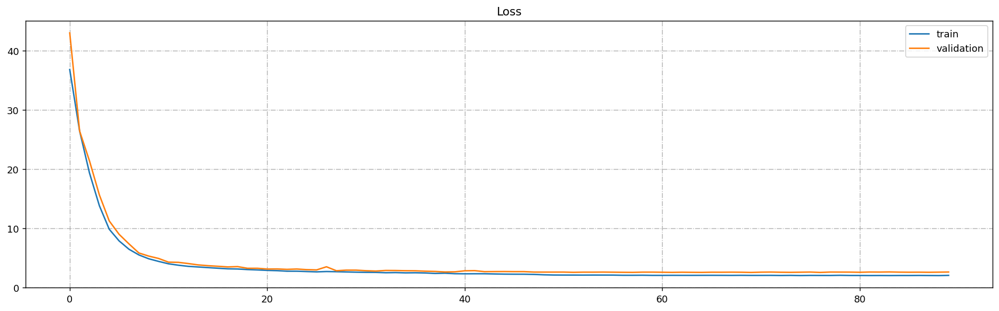

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(18, 5), dpi=130)

axs.grid(linestyle="dashdot")
axs.set_title("Loss")
axs.plot(hist.history['loss'][5:])
axs.plot(hist.history['val_loss'][5:])
axs.legend(["train", "validation"])

plt.show()

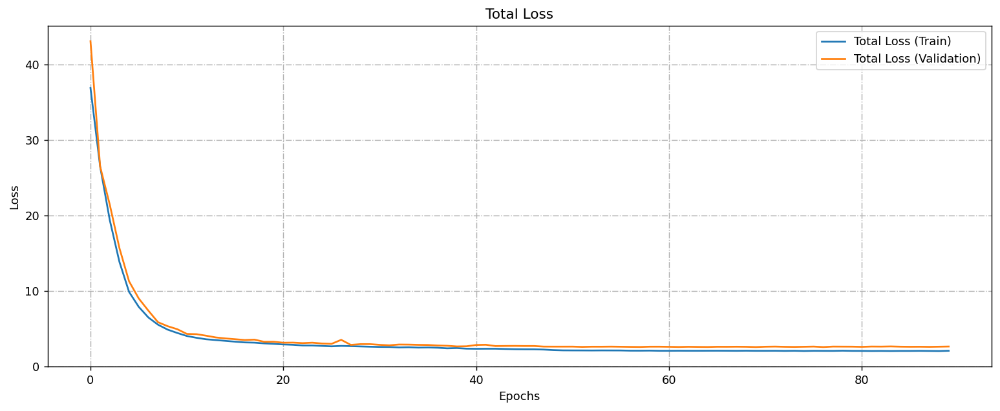

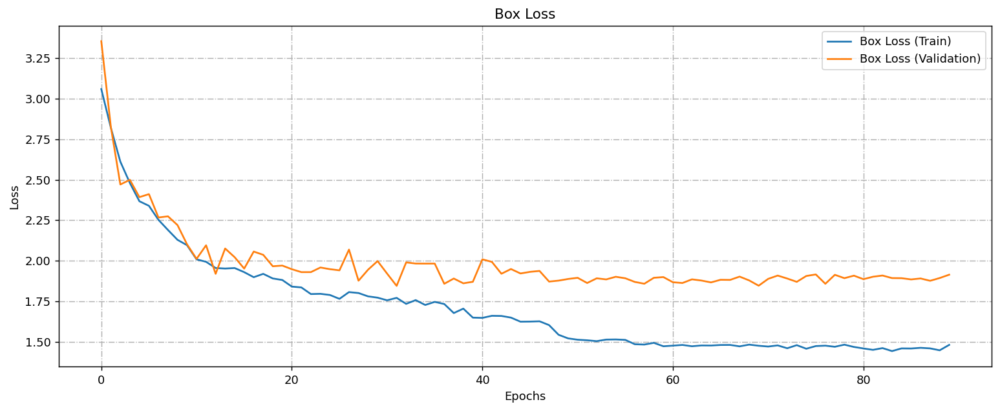

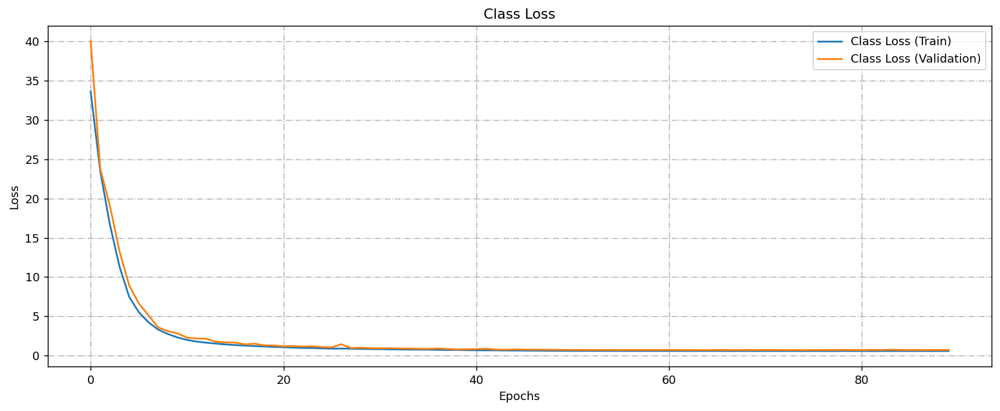

In [ ]:
# Total Loss
fig, axs = plt.subplots(1, 1, figsize=(12, 5), dpi=130)
axs.grid(linestyle="dashdot")
axs.set_title("Total Loss")
axs.plot(hist.history['loss'][5:], label="Total Loss (Train)")
axs.plot(hist.history['val_loss'][5:], label="Total Loss (Validation)")
axs.legend()
axs.set_xlabel("Epochs")
axs.set_ylabel("Loss")
plt.tight_layout()
plt.show()

# Box Loss
fig, axs = plt.subplots(1, 1, figsize=(12, 5), dpi=130)
axs.grid(linestyle="dashdot")
axs.set_title("Box Loss")
axs.plot(hist.history['box_loss'][5:], label="Box Loss (Train)")
axs.plot(hist.history['val_box_loss'][5:], label="Box Loss (Validation)")
axs.legend()
axs.set_xlabel("Epochs")
axs.set_ylabel("Loss")
plt.tight_layout()
plt.show()

# Class Loss
fig, axs = plt.subplots(1, 1, figsize=(12, 5), dpi=130)
axs.grid(linestyle="dashdot")
axs.set_title("Class Loss")
axs.plot(hist.history['class_loss'][5:], label="Class Loss (Train)")
axs.plot(hist.history['val_class_loss'][5:], label="Class Loss (Validation)")
axs.legend()
axs.set_xlabel("Epochs")
axs.set_ylabel("Loss")
plt.tight_layout()
plt.show()


In [ ]:
evaluation=YOLOV8_model.evaluate(test_dataset)

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 775ms/step - box_loss: 1.9255 - class_loss: 0.7241 - loss: 2.6246


In [ ]:
def calculate_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    iou = intersection / (union + 1e-10)
    return iou

In [ ]:
def non_maximum_suppression(boxes, scores, classes, iou_threshold=0.5):
    selected_indices = []

    boxes = boxes.numpy() if hasattr(boxes, 'numpy') else boxes
    scores = scores.numpy() if hasattr(scores, 'numpy') else scores
    classes = classes.numpy() if hasattr(classes, 'numpy') else classes

    order = np.argsort(scores)[::-1]

    while len(order) > 0:
        current_idx = order[0]
        selected_indices.append(current_idx)

        if len(order) == 1:
            break

        order = order[1:]

        ious = np.array([calculate_iou(boxes[current_idx], boxes[idx]) for idx in order])

        mask = ious < iou_threshold
        order = order[mask]

    return selected_indices

def visualize_predict_detections(model, dataset, bounding_box_format, iou_threshold=0.5):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images, verbose=0)

    filtered_pred = {
        'boxes': [],
        'confidence': [],
        'classes': [],
        'num_detections': []
    }

    for i in range(len(images)):
        boxes = y_pred['boxes'][i][:y_pred['num_detections'][i]]
        scores = y_pred['confidence'][i][:y_pred['num_detections'][i]]
        classes = y_pred['classes'][i][:y_pred['num_detections'][i]]

        selected_indices = non_maximum_suppression(
            boxes,
            scores,
            classes,
            iou_threshold=iou_threshold
        )

        filtered_pred['boxes'].append(boxes[selected_indices])
        filtered_pred['confidence'].append(scores[selected_indices])
        filtered_pred['classes'].append(classes[selected_indices])
        filtered_pred['num_detections'].append(len(selected_indices))

    filtered_pred['boxes'] = tf.ragged.constant(filtered_pred['boxes']).to_tensor()
    filtered_pred['confidence'] = tf.ragged.constant(filtered_pred['confidence']).to_tensor()
    filtered_pred['classes'] = tf.ragged.constant(filtered_pred['classes']).to_tensor()
    filtered_pred['num_detections'] = np.array(filtered_pred['num_detections'])

    keras_cv.visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=filtered_pred,
        true_color=(192, 57, 43),
        pred_color=(144, 238, 144),
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=2,
        cols=2,
        show=True,
        class_mapping=class_mapping,
    )

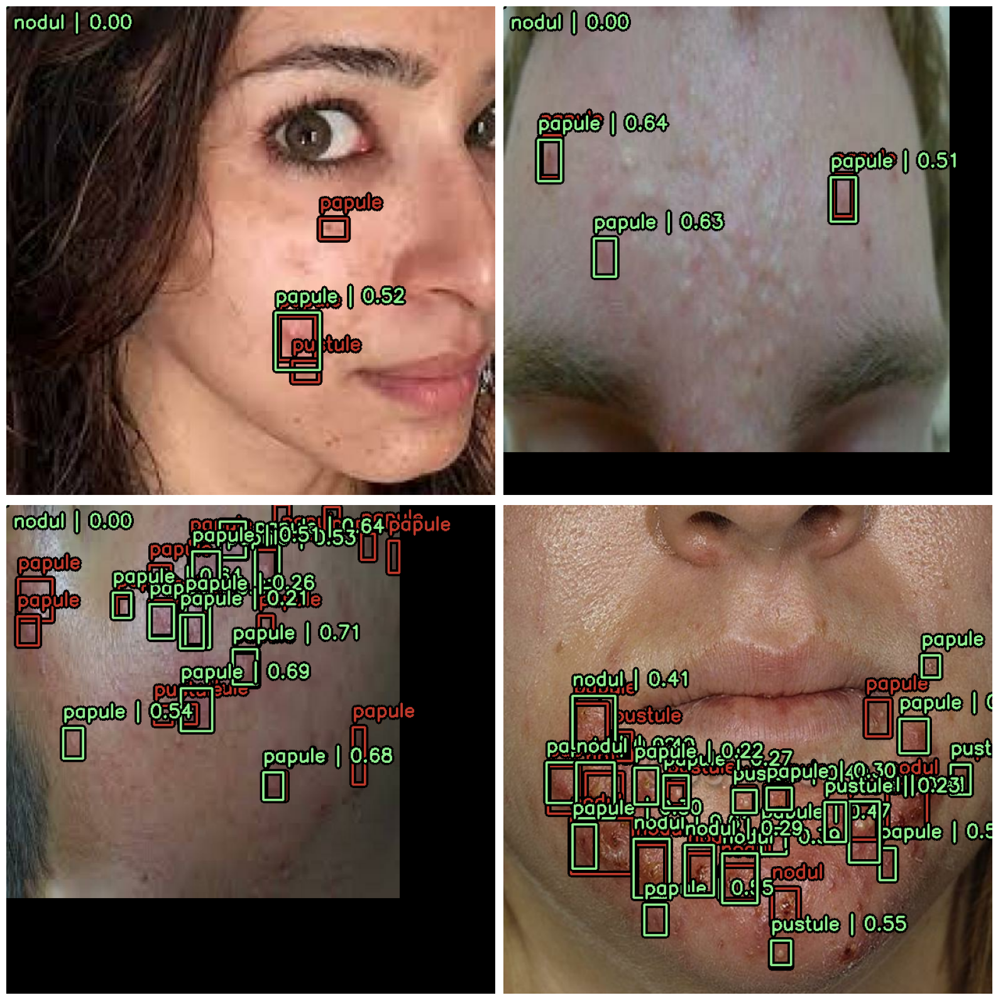

In [ ]:
visualize_predict_detections(YOLOV8_model, dataset = test_dataset, bounding_box_format="xyxy")

In [ ]:
def evaluate_detailed(model, dataset, confidence_threshold=0.2, iou_threshold=0.5):
    all_true_labels = []
    all_pred_labels = []

    for images, y_true_batch in dataset:
        y_pred_batch = model.predict(images, verbose=0)
        batch_size = images.shape[0]

        for i in range(batch_size):
            if isinstance(y_true_batch['boxes'], tf.RaggedTensor):
                current_true_boxes = y_true_batch['boxes'][i].numpy()
                current_true_classes = y_true_batch['classes'][i].numpy()
            else:
                current_true_boxes = y_true_batch['boxes'][i].numpy()
                current_true_classes = y_true_batch['classes'][i].numpy()

            current_pred_boxes = y_pred_batch['boxes'][i][:y_pred_batch['num_detections'][i]]
            current_pred_scores = y_pred_batch['confidence'][i][:y_pred_batch['num_detections'][i]]
            current_pred_classes = y_pred_batch['classes'][i][:y_pred_batch['num_detections'][i]]

            mask = current_pred_scores >= confidence_threshold
            current_pred_boxes = current_pred_boxes[mask]
            current_pred_scores = current_pred_scores[mask]
            current_pred_classes = current_pred_classes[mask]

            num_true = len(current_true_boxes)
            num_pred = len(current_pred_boxes)
            iou_matrix = np.zeros((num_true, num_pred))

            for t_idx in range(num_true):
                for p_idx in range(num_pred):
                    iou_matrix[t_idx, p_idx] = calculate_iou(
                        current_true_boxes[t_idx],
                        current_pred_boxes[p_idx]
                    )

            matched_true = set()
            matched_pred = set()

            while True:
                if len(matched_true) == num_true or len(matched_pred) == num_pred:
                    break

                unmatched_true = [i for i in range(num_true) if i not in matched_true]
                unmatched_pred = [i for i in range(num_pred) if i not in matched_pred]

                if not unmatched_true or not unmatched_pred:
                    break

                current_iou = iou_matrix[unmatched_true][:, unmatched_pred]

                if current_iou.max() < iou_threshold:
                    break

                true_idx, pred_idx = np.unravel_index(current_iou.argmax(), current_iou.shape)
                true_idx = unmatched_true[true_idx]
                pred_idx = unmatched_pred[pred_idx]

                matched_true.add(true_idx)
                matched_pred.add(pred_idx)

                all_true_labels.append(current_true_classes[true_idx])
                all_pred_labels.append(current_pred_classes[pred_idx])

            for p_idx in range(num_pred):
                if p_idx not in matched_pred:
                    all_true_labels.append(-1)
                    all_pred_labels.append(current_pred_classes[p_idx])

            for t_idx in range(num_true):
                if t_idx not in matched_true:
                    all_true_labels.append(current_true_classes[t_idx])
                    all_pred_labels.append(-1)

    all_true_labels = np.array(all_true_labels)
    all_pred_labels = np.array(all_pred_labels)

    valid_mask = (all_true_labels != -1) & (all_pred_labels != -1)
    cm = confusion_matrix(
        all_true_labels[valid_mask],
        all_pred_labels[valid_mask],
        labels=range(len(class_mapping))
    )

    results = {
        'per_class': {},
        'overall': {},
        'confusion_matrix_data': {
            'y_true': all_true_labels,
            'y_pred': all_pred_labels
        }
    }

    total_support = 0
    macro_precision = 0
    macro_recall = 0
    macro_f1 = 0
    weighted_precision = 0
    weighted_recall = 0
    weighted_f1 = 0

    for class_id in range(len(class_mapping)):
        tp = cm[class_id, class_id]
        fp = cm[:, class_id].sum() - tp
        fn = cm[class_id, :].sum() - tp
        support = tp + fn

        if support > 0:
            precision = tp / max(tp + fp, 1)
            recall = tp / max(tp + fn, 1)
            f1 = 2 * (precision * recall) / max(precision + recall, 1e-10)

            results['per_class'][class_id] = {
                'precision': precision,
                'recall': recall,
                'f1-score': f1,
                'support': support
            }

            macro_precision += precision
            macro_recall += recall
            macro_f1 += f1
            weighted_precision += precision * support
            weighted_recall += recall * support
            weighted_f1 += f1 * support
            total_support += support

    num_classes = len(results['per_class'])
    total_true_positives = np.sum([cm[i,i] for i in range(len(class_mapping))])

    results['overall'] = {
        'accuracy': total_true_positives / total_support,
        'macro avg': {
            'precision': macro_precision / num_classes,
            'recall': macro_recall / num_classes,
            'f1-score': macro_f1 / num_classes,
            'support': total_support
        },
        'weighted avg': {
            'precision': weighted_precision / total_support,
            'recall': weighted_recall / total_support,
            'f1-score': weighted_f1 / total_support,
            'support': total_support
        }
    }

    return results

def plot_confusion_matrix(y_true, y_pred, class_mapping):
    valid_mask = (y_true != -1) & (y_pred != -1)
    cm = confusion_matrix(
        y_true[valid_mask],
        y_pred[valid_mask],
        labels=range(len(class_mapping))
    )

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=list(class_mapping.values()),
                yticklabels=list(class_mapping.values()))
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()

    return cm

def print_evaluation_report(results):
    headers = ['', 'precision', 'recall', 'f1-score', 'support']
    rows = []

    for class_id, metrics in results['per_class'].items():
        class_name = class_mapping[class_id]
        rows.append([
            class_name,
            f"{metrics['precision']:.2f}",
            f"{metrics['recall']:.2f}",
            f"{metrics['f1-score']:.2f}",
            f"{metrics['support']}"
        ])

    rows.append([
        'accuracy',
        '',
        '',
        f"{results['overall']['accuracy']:.2f}",
        f"{results['overall']['macro avg']['support']}"
    ])

    macro = results['overall']['macro avg']
    rows.append([
        'macro avg',
        f"{macro['precision']:.2f}",
        f"{macro['recall']:.2f}",
        f"{macro['f1-score']:.2f}",
        f"{macro['support']}"
    ])

    weighted = results['overall']['weighted avg']
    rows.append([
        'weighted avg',
        f"{weighted['precision']:.2f}",
        f"{weighted['recall']:.2f}",
        f"{weighted['f1-score']:.2f}",
        f"{weighted['support']}"
    ])

    print(tabulate(rows, headers=headers, floatfmt='.2f'))

def evaluate_model_performance(model, train_dataset, test_dataset):
    print("Training Performance:")
    train_results = evaluate_detailed(model, train_dataset)
    print_evaluation_report(train_results)
    print("\nTraining Confusion Matrix:")
    plot_confusion_matrix(
        train_results['confusion_matrix_data']['y_true'],
        train_results['confusion_matrix_data']['y_pred'],
        class_mapping
    )

    print("\nTesting Performance:")
    test_results = evaluate_detailed(model, test_dataset)
    print_evaluation_report(test_results)
    print("\nTesting Confusion Matrix:")
    plot_confusion_matrix(
        test_results['confusion_matrix_data']['y_true'],
        test_results['confusion_matrix_data']['y_pred'],
        class_mapping
    )

Training Performance:
              precision    recall      f1-score    support
------------  -----------  --------  ----------  ---------
nodul         0.66         0.38            0.48        449
papule        0.85         0.97            0.91       2600
pustule       0.67         0.44            0.53        488
accuracy                                   0.82       3537
macro avg     0.73         0.59            0.64       3537
weighted avg  0.80         0.82            0.80       3537

Training Confusion Matrix:


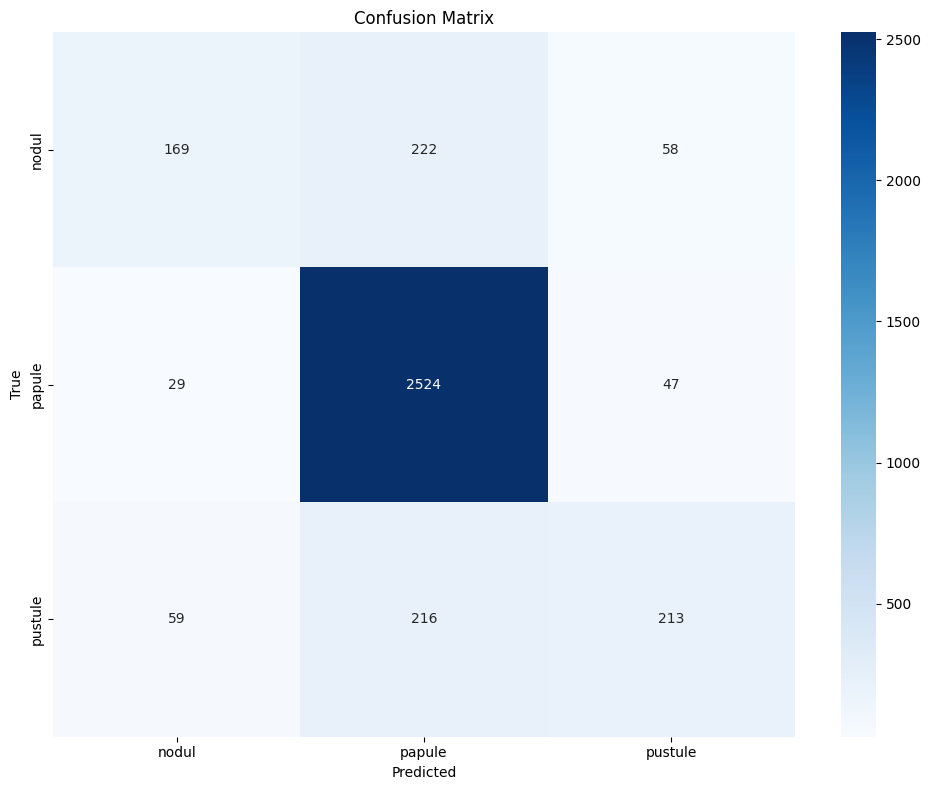


Testing Performance:
              precision    recall      f1-score    support
------------  -----------  --------  ----------  ---------
nodul         0.75         0.33            0.46         27
papule        0.82         0.98            0.89        214
pustule       0.76         0.40            0.52         55
accuracy                                   0.81        296
macro avg     0.78         0.57            0.63        296
weighted avg  0.80         0.81            0.78        296

Testing Confusion Matrix:


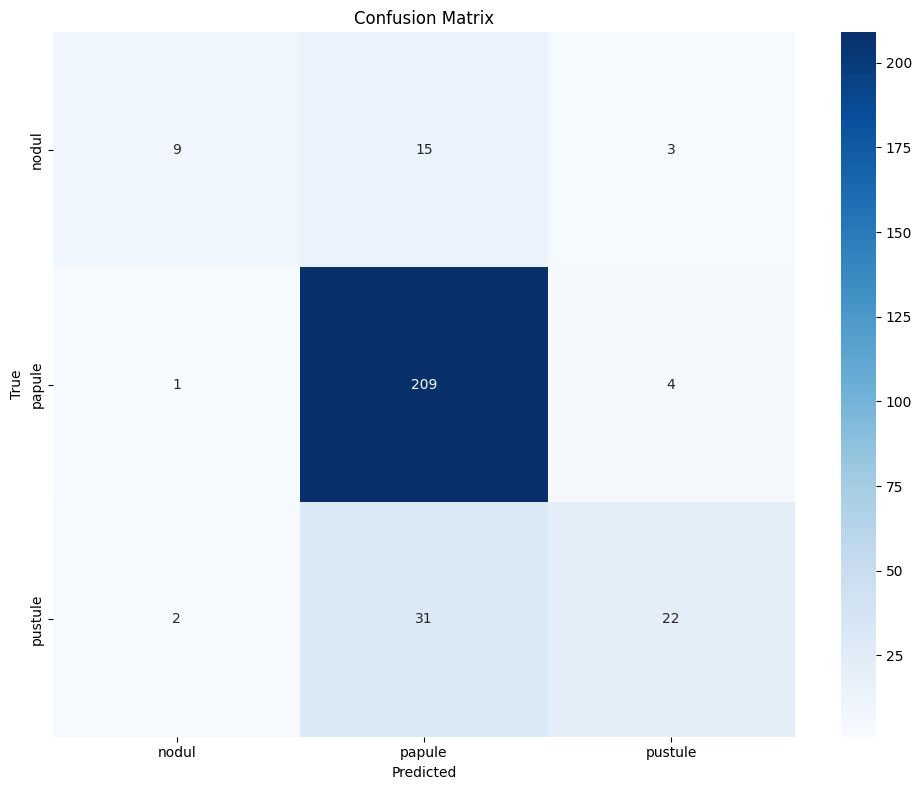

In [ ]:
evaluate_model_performance(YOLOV8_model, train_dataset, test_dataset)

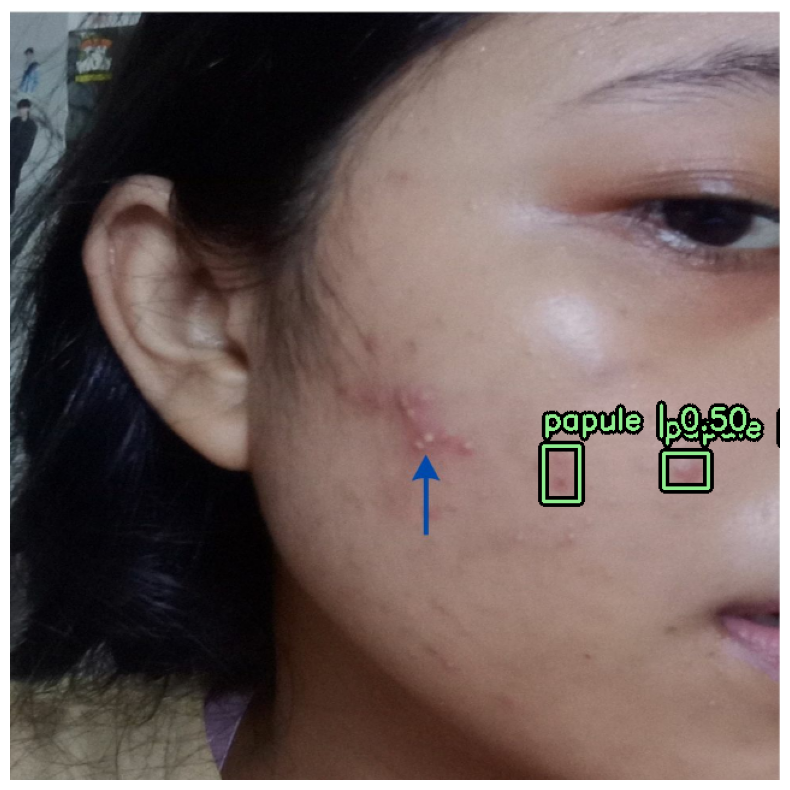

In [ ]:
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, (640, 640))
    return img

def visualize_single_image_predictions(model, image_path, bounding_box_format, iou_threshold=0.5):
    img = load_and_preprocess_image(image_path)
    img_batch = tf.expand_dims(img, axis=0)

    y_pred = model.predict(img_batch, verbose=0)

    boxes = y_pred['boxes'][0][:y_pred['num_detections'][0]]
    scores = y_pred['confidence'][0][:y_pred['num_detections'][0]]
    classes = y_pred['classes'][0][:y_pred['num_detections'][0]]

    selected_indices = non_maximum_suppression(
        boxes,
        scores,
        classes,
        iou_threshold=iou_threshold
    )

    filtered_pred = {
        'boxes': tf.expand_dims(boxes[selected_indices], 0),
        'confidence': tf.expand_dims(scores[selected_indices], 0),
        'classes': tf.expand_dims(classes[selected_indices], 0),
        'num_detections': np.array([len(selected_indices)])
    }

    keras_cv.visualization.plot_bounding_box_gallery(
        img_batch,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_pred=filtered_pred,
        pred_color=(144, 238, 144),
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=1,
        cols=1,
        show=True,
        class_mapping=class_mapping,
    )

test_image_path = 'test.jpg'

visualize_single_image_predictions(
    YOLOV8_model, test_image_path, bounding_box_format="xyxy"
)

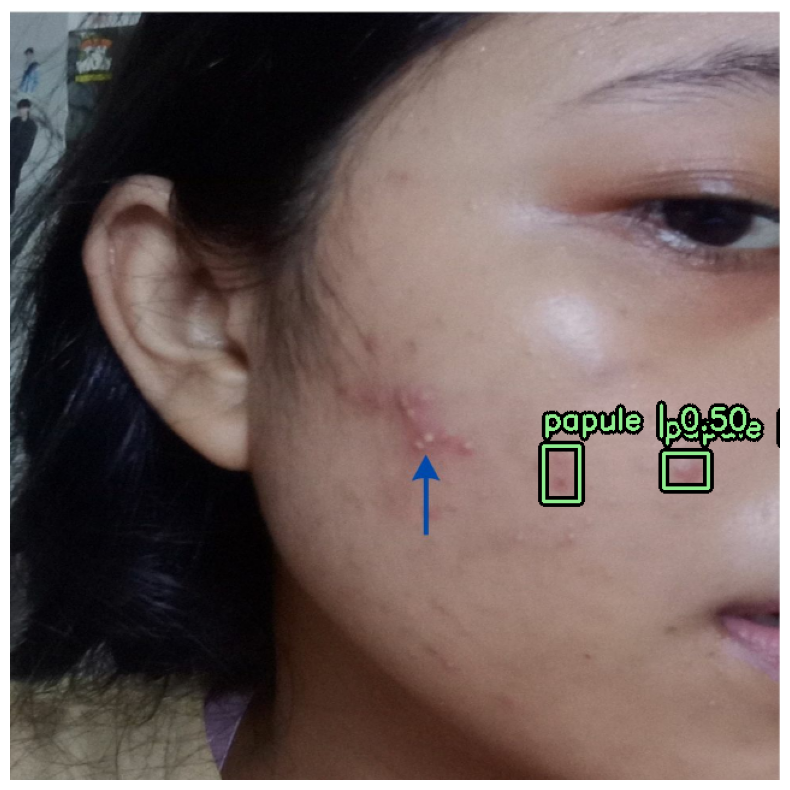

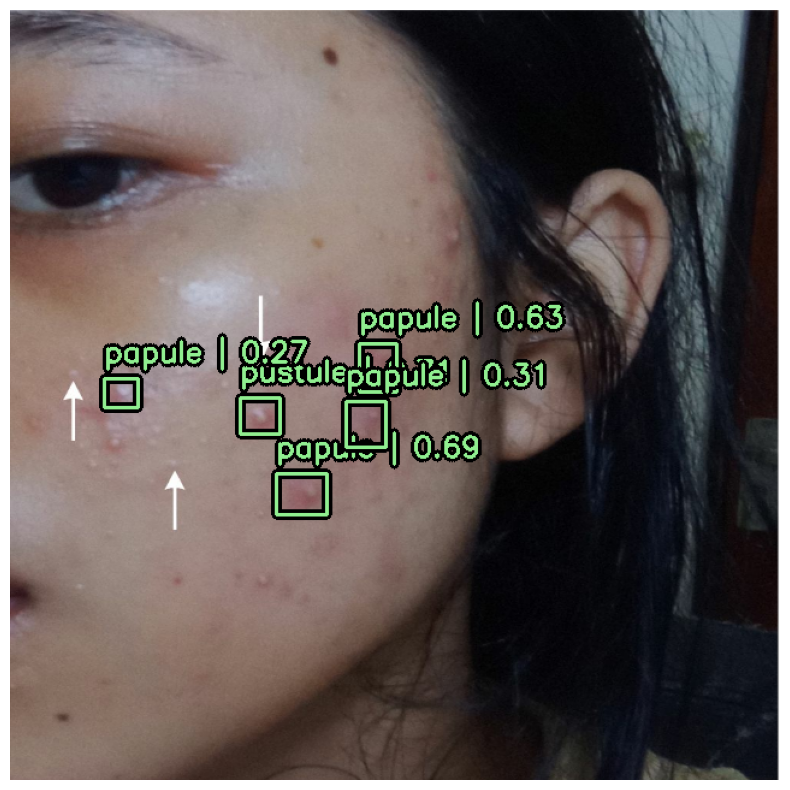

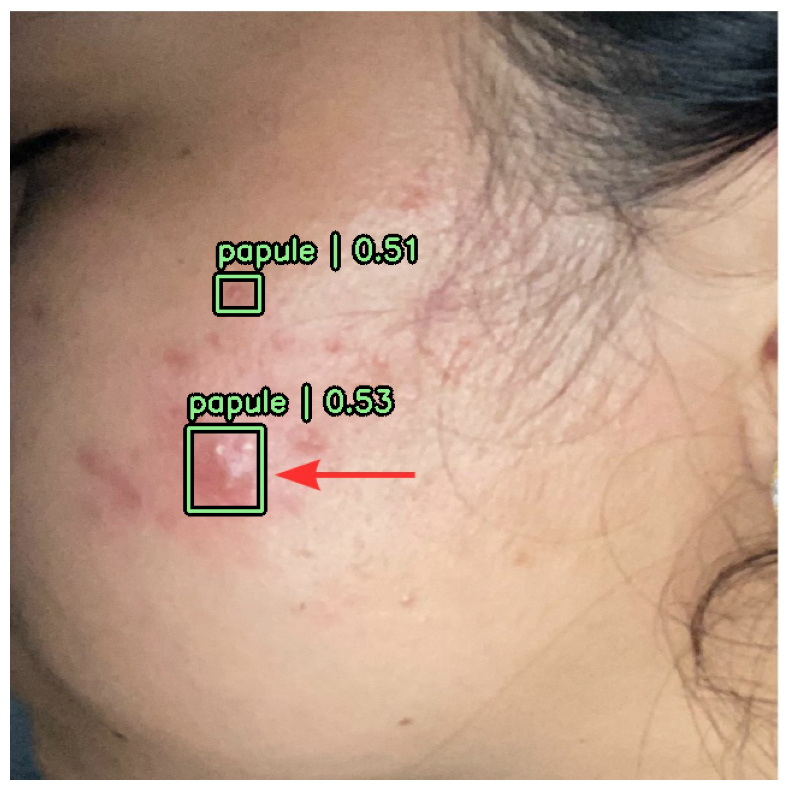

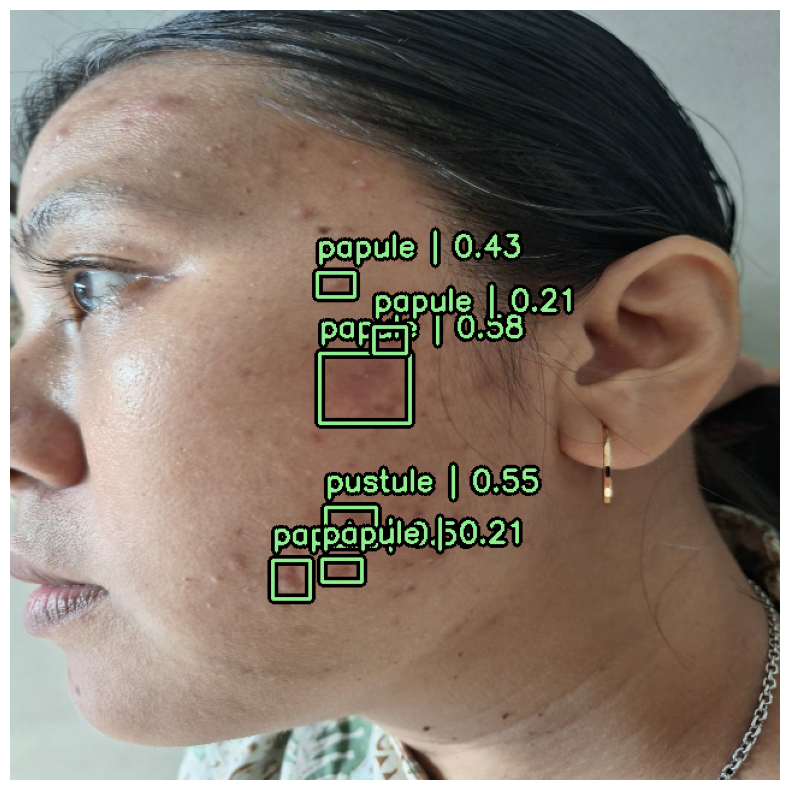

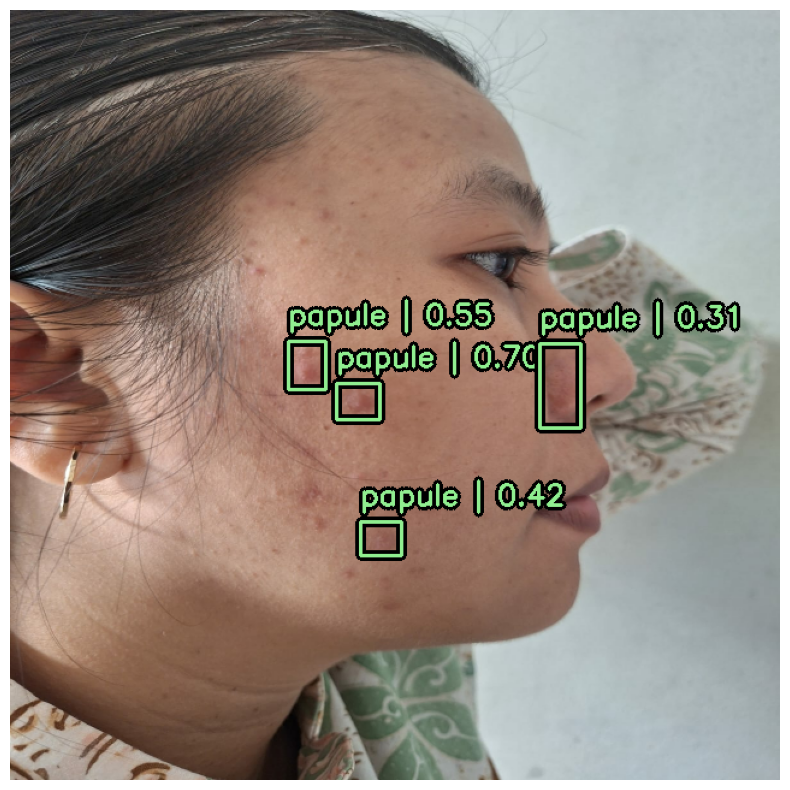

In [ ]:
test_image_paths = ['test.jpg', 'test2.jpg', 'test3.jpg', 'test4.jpg', 'test5.jpg']

for image_path in test_image_paths:
    visualize_single_image_predictions(
        YOLOV8_model, image_path, bounding_box_format="xyxy"
    )



Analysis for: test.jpg
Total Detections: 2
Number of Papules: 2
Number of Pustules: 0
Number of Nodules: 0
Severity Level: 1 (Almost Clear)
--------------------------------------------------


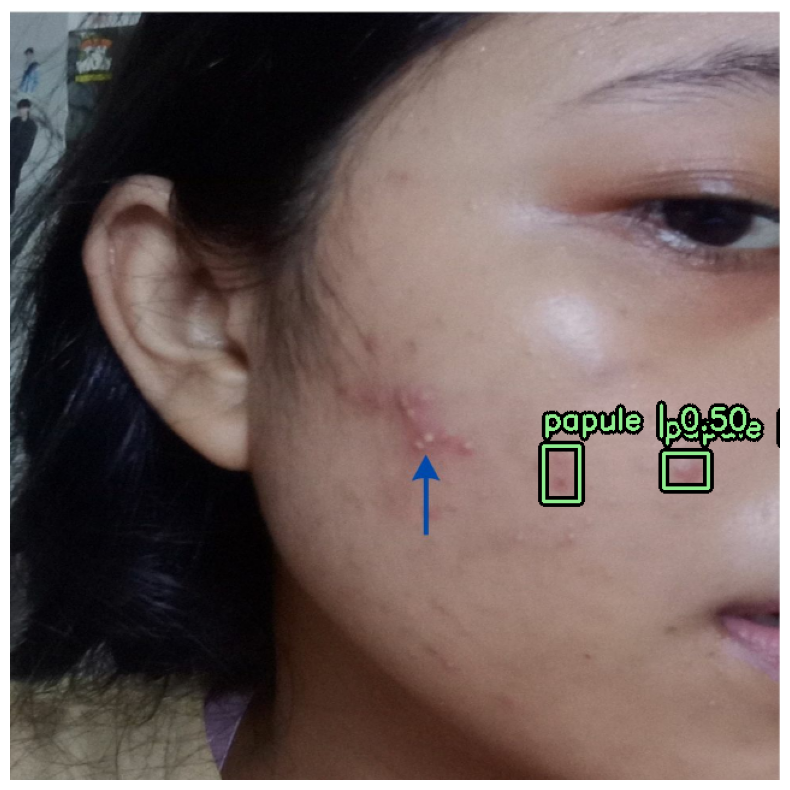


Analysis for: test2.jpg
Total Detections: 5
Number of Papules: 4
Number of Pustules: 1
Number of Nodules: 0
Severity Level: 2 (Mild)
--------------------------------------------------


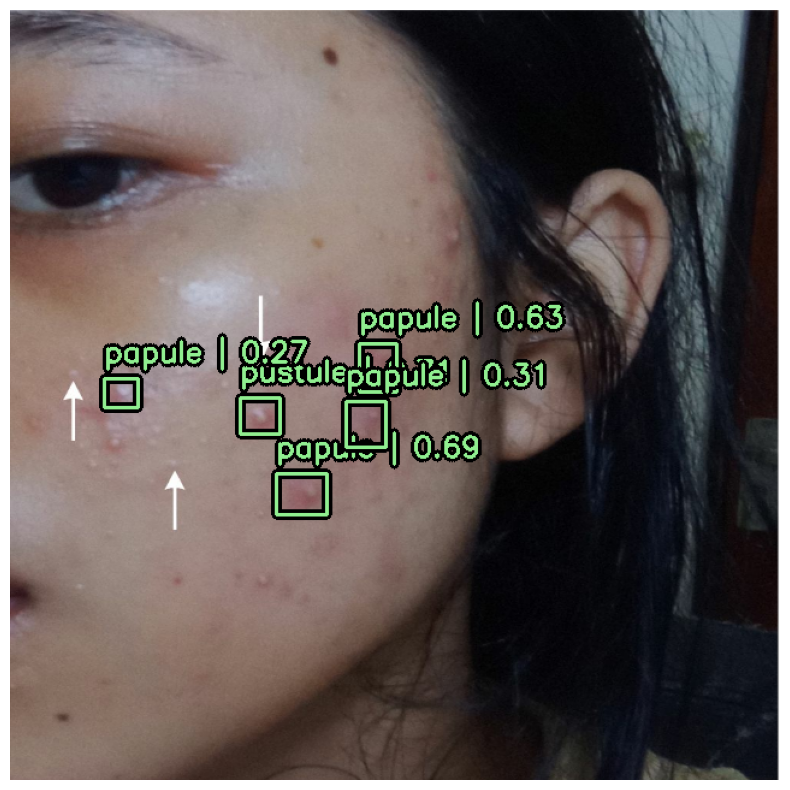


Analysis for: test3.jpg
Total Detections: 2
Number of Papules: 2
Number of Pustules: 0
Number of Nodules: 0
Severity Level: 1 (Almost Clear)
--------------------------------------------------


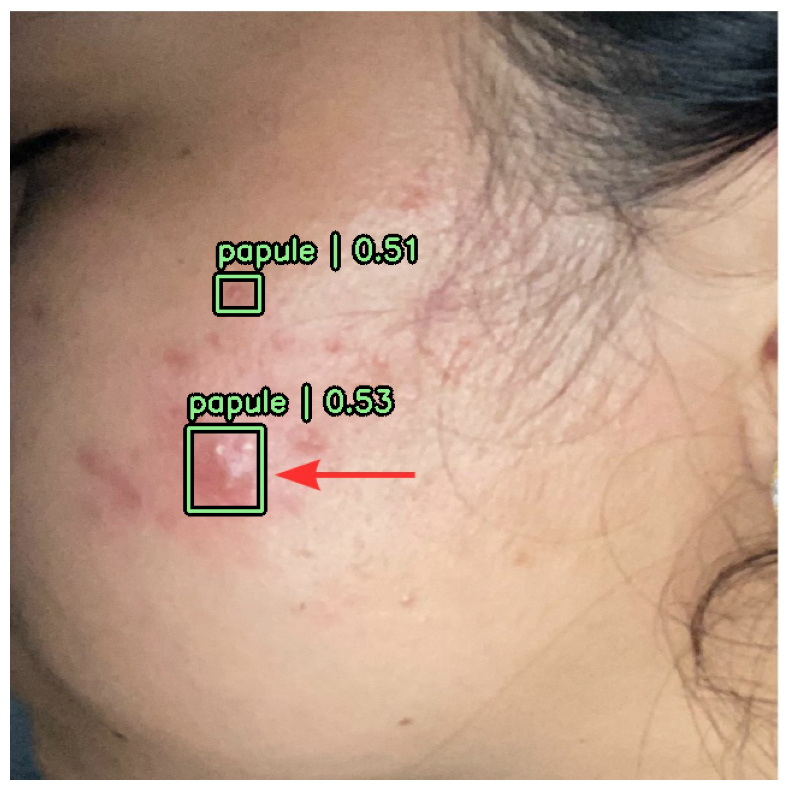


Analysis for: test4.jpg
Total Detections: 6
Number of Papules: 5
Number of Pustules: 1
Number of Nodules: 0
Severity Level: 3 (Moderate)
--------------------------------------------------


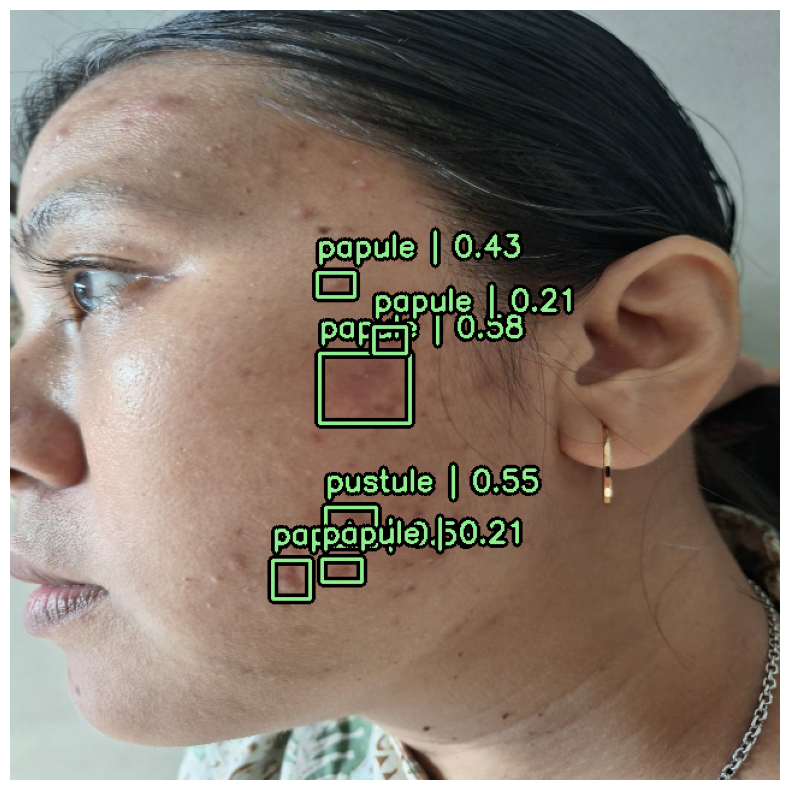


Analysis for: test5.jpg
Total Detections: 4
Number of Papules: 4
Number of Pustules: 0
Number of Nodules: 0
Severity Level: 2 (Mild)
--------------------------------------------------


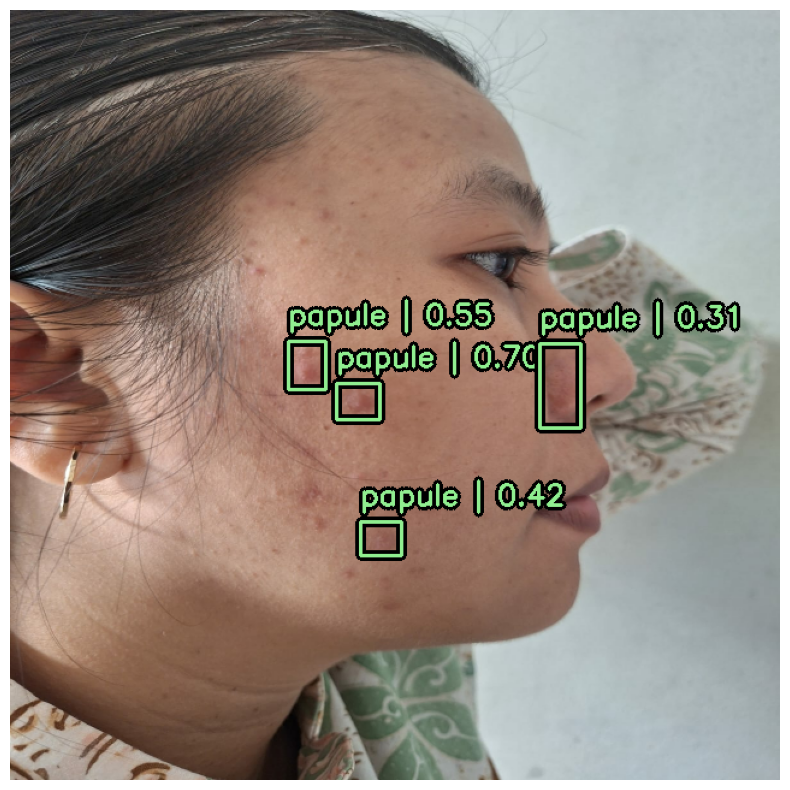

In [ ]:
def visualize_single_image_predictions_count(model, image_path, bounding_box_format, confidence_threshold=0.5, iou_threshold=0.5):
    img = load_and_preprocess_image(image_path)
    img_batch = tf.expand_dims(img, axis=0)

    y_pred = model.predict(img_batch, verbose=0)

    boxes = y_pred["boxes"][0]
    class_ids = y_pred["classes"][0]
    confidence_scores = y_pred["confidence"][0]

    mask = confidence_scores >= confidence_threshold
    boxes = boxes[mask]
    class_ids = class_ids[mask]
    confidence_scores = confidence_scores[mask]

    selected_indices = non_maximum_suppression(
        boxes,
        confidence_scores,
        class_ids,
        iou_threshold=iou_threshold
    )

    boxes = boxes[selected_indices]
    class_ids = class_ids[selected_indices]
    confidence_scores = confidence_scores[selected_indices]

    bounding_boxes = {
        "boxes": tf.expand_dims(boxes, 0),
        "classes": tf.expand_dims(class_ids, 0),
        "confidence": tf.expand_dims(confidence_scores, 0),
    }

    keras_cv.visualization.plot_bounding_box_gallery(
        img_batch,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_pred=bounding_boxes,
        pred_color=(144, 238, 144),
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=1,
        cols=1,
        show=True,
        class_mapping=class_mapping,
    )

def determine_iga_level_v2(acne_detections):
    papule_count = acne_detections.get(1, 0)
    pustule_count = acne_detections.get(2, 0)
    nodul_count = acne_detections.get(0, 0)

    if papule_count == 0 and pustule_count == 0 and nodul_count == 0:
        return 0
    elif (1 <= papule_count <= 3 or 1 <= pustule_count <= 3) and nodul_count == 0:
        return 1
    elif (3 <= papule_count <= 5 or 3 <= pustule_count <= 5) and nodul_count == 0:
        return 2
    elif (5 <= papule_count <= 10 or 5 <= pustule_count <= 10):
        return 3
    elif (5 <= papule_count <= 10 or 5 <= pustule_count <= 10 and 1 <= nodul_count <= 3):
        return 4
    elif (5 <= papule_count <= 10 or 5 <= pustule_count <= 10 and nodul_count > 3):
        return 5
    else:
        return 0

def count_acne_detections_v2(model, image_path, bounding_box_format, confidence_threshold=0.5, iou_threshold=0.5):
    img = load_and_preprocess_image(image_path)
    img_batch = tf.expand_dims(img, axis=0)

    y_pred = model.predict(img_batch, verbose=0)

    boxes = y_pred["boxes"][0]
    class_ids = y_pred["classes"][0]
    confidence_scores = y_pred["confidence"][0]

    mask = confidence_scores >= confidence_threshold
    boxes = boxes[mask]
    class_ids = class_ids[mask]
    confidence_scores = confidence_scores[mask]

    selected_indices = non_maximum_suppression(
        boxes,
        confidence_scores,
        class_ids,
        iou_threshold=iou_threshold
    )
    boxes = boxes[selected_indices]
    class_ids = class_ids[selected_indices]
    confidence_scores = confidence_scores[selected_indices]

    acne_detections = {class_id: 0 for class_id in class_mapping.keys()}
    for class_id in class_ids:
        if class_id in acne_detections:
            acne_detections[class_id] += 1

    iga_level = determine_iga_level_v2(acne_detections)

    iga_descriptions = {
        0: 'Clear',
        1: 'Almost Clear',
        2: 'Mild',
        3: 'Moderate',
        4: 'Severe',
        5: 'Very Severe'
    }
    severity_description = iga_descriptions[iga_level]

    papule_count = acne_detections.get(1, 0)
    pustule_count = acne_detections.get(2, 0)
    nodul_count = acne_detections.get(0, 0)
    inflammatory_count = papule_count + pustule_count 

    print(f"\nAnalysis for: {image_path}")
    print(f"Total Detections: {len(class_ids)}")
    print(f"Number of Papules: {papule_count}")
    print(f"Number of Pustules: {pustule_count}")
    print(f"Number of Nodules: {nodul_count}")
    print(f"Severity Level: {iga_level} ({severity_description})")
    print("-" * 50)

    visualize_single_image_predictions_count(
        model,
        image_path,
        bounding_box_format,
        confidence_threshold,
        iou_threshold
    )

for image_path in test_image_paths:
    count_acne_detections_v2(
        YOLOV8_model,
        image_path,
        bounding_box_format="xyxy",
        confidence_threshold=0.2,
        iou_threshold=0.5
    )